In [4]:
import os 
import sys
sys.path.append(os.path.dirname(os.path.dirname(os.getcwd())))

from gensim import models
import pandas as pd
import numpy as np
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

from doc_embedding.moyenne import *
import json

In [2]:
#fichier sous la forme d'un dataframe
cbow_model = models.KeyedVectors.load_word2vec_format('../../data/tuning/cbow.kv')
data = pd.DataFrame(cbow_model.vectors,index=cbow_model.index_to_key)

with open("../../data/docs.json") as file:
    docs = json.load(file)
moy_embedding_tfidf = word_emb_vers_doc_emb_moyenne(docs=docs, modele=cbow_model, methode = 'TF-IDF')

data=pd.DataFrame(moy_embedding_tfidf)
X = data.values

# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

In [5]:
tsne = TSNE(n_components=2) 
coord= tsne.fit_transform(X_scaled)
print(coord.shape)

/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


(9501, 2)


In [6]:
tsne.kl_divergence_

1.7044070959091187

### Etude des différents paramètres

/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/

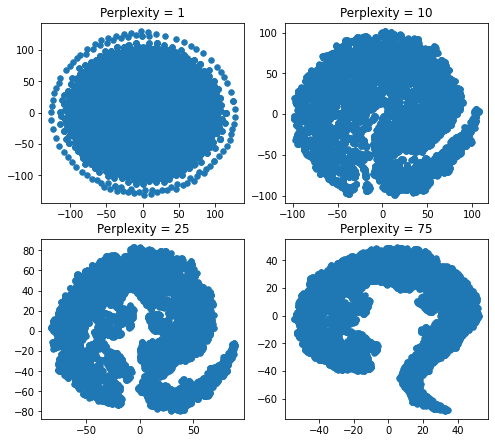

In [7]:
#Jouer avec les différents paramètres : la perplexity
#p : le nombre de voisins les plus proches en fonction duquel t-SNE déterminera les voisins potentiels
#n : dimension de l'espace inférieur
plt.figure(figsize = (8,4))
plt.subplots_adjust(top = 1.5) 
for index, p in enumerate([1, 10, 25, 75]):
    tsne = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results = tsne.fit_transform(X)
    tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2'])
    plt.subplot(2,2,index+1)
    plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], s=30)
    plt.title('Perplexity = '+ str(p))
plt.show()

/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/

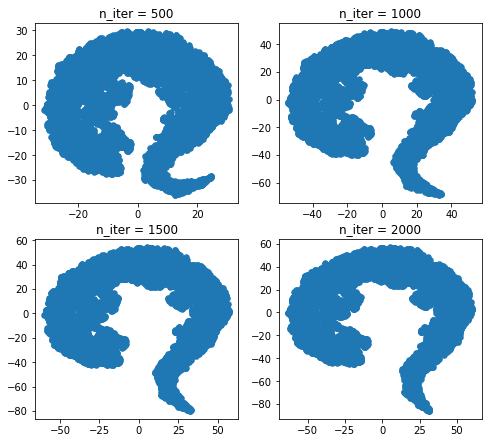

In [8]:
#Nb itérations
plt.figure(figsize = (8,4))
plt.subplots_adjust(top = 1.5) 
for index, p in enumerate([500, 1000, 1500, 2000]):
    tsne = TSNE(n_components = 2, perplexity = 75, random_state=0, n_iter=p)
    tsne_results = tsne.fit_transform(X)
    tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2'])
    plt.subplot(2,2,index+1)
    plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], s=30)
    plt.title('n_iter = '+ str(p))
plt.show()

/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1897/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


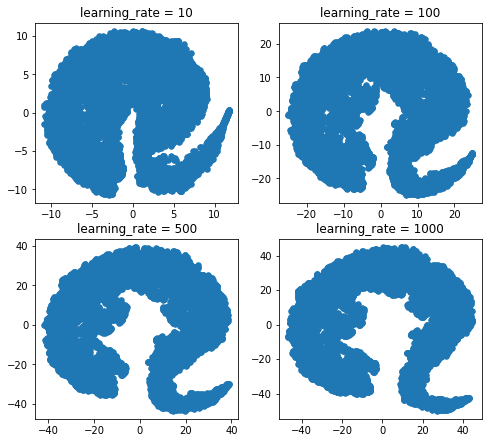

In [9]:
#Learning rate
plt.figure(figsize = (8,4))
plt.subplots_adjust(top = 1.5) 
for index, p in enumerate([10, 100, 500, 1000]):
    tsne = TSNE(n_components = 2, perplexity = 75, random_state=0, n_iter=500, learning_rate=p)
    tsne_results = tsne.fit_transform(X)
    tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2'])
    plt.subplot(2,2,index+1)
    plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], s=30)
    plt.title('learning_rate = '+ str(p))
plt.show()